In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pydicom
from pathlib import Path
import os
import nibabel as nib

# Compare Reconstruction Approaches

Image shape: (320, 320)


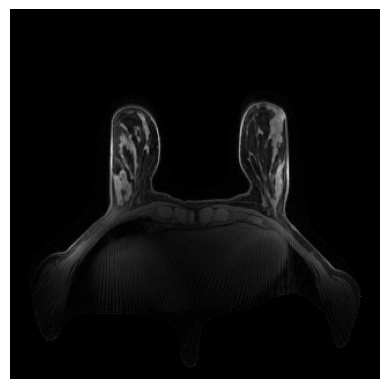

In [8]:
slice = '020'

# Load the NIfTI image
#nii_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_001_1/slice_{slice}_frame_000.nii' 
nii_path = f'/ess/scratch/scratch1/rachelgordon/complex_fully_sampled/fastMRI_breast_001_1/slice_{slice}_frame_000.nii' 
nii_image = nib.load(nii_path)


# Get the image data as a NumPy array
image_data = nii_image.get_fdata()

real_part = image_data[0]
imag_part = image_data[1]
grasp_fs = np.abs(real_part + 1j * imag_part)

# Check the shape of the image data
print("Image shape:", grasp_fs.shape)

# Plot a specific slice (for a 3D volume, e.g., (x, y, z))
plt.imshow(grasp_fs, cmap='gray')
plt.axis('off')
# plt.title(f'GRASP Slice 0 Fully Sampled')
plt.show()


Image shape: (320, 320)


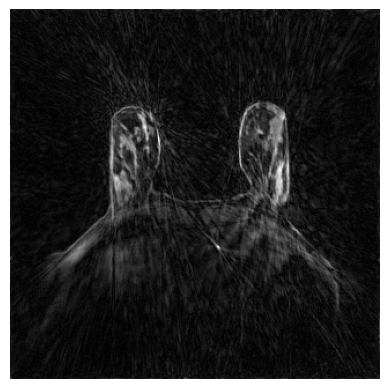

In [7]:
slice = '020'

# Load the NIfTI image
#nii_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_001_1/slice_{slice}_frame_000.nii' 
nii_path = f'/ess/scratch/scratch1/rachelgordon/complex_undersampled/fastMRI_breast_001_1/slice_{slice}_frame_000.nii' 
nii_image = nib.load(nii_path)


# Get the image data as a NumPy array
image_data = nii_image.get_fdata()

real_part = image_data[0]
imag_part = image_data[1]
grasp_us = np.abs(real_part + 1j * imag_part)

# Check the shape of the image data
print("Image shape:", grasp_us.shape)

# Plot a specific slice (for a 3D volume, e.g., (x, y, z))
plt.imshow(grasp_us, cmap='gray')
plt.axis('off')
# plt.title(f'GRASP Slice 0 Undersampled')
plt.show()


In [86]:
def get_traj(N_spokes=13, N_time=1, base_res=320, gind=1):

    N_tot_spokes = N_spokes * N_time

    N_samples = base_res * 2

    base_lin = np.arange(N_samples).reshape(1, -1) - base_res

    tau = 0.5 * (1 + 5**0.5)
    base_rad = np.pi / (gind + tau - 1)

    base_rot = np.arange(N_tot_spokes).reshape(-1, 1) * base_rad

    traj = np.zeros((N_tot_spokes, N_samples, 2))

    traj[..., 0] = np.cos(base_rot) @ base_lin
    traj[..., 1] = np.sin(base_rot) @ base_lin

    traj = traj / 2

    traj = traj.reshape(N_time, N_spokes, N_samples, 2)

    # Now reshape the trajectory to match Nrad, N_time
    # Nrad = 2 * Ny * n_spokes or N_spokes * N_samples
    traj = traj.reshape(N_spokes * N_samples, N_time, 2)  # (N_time, Nrad, 2)

    return traj

In [87]:
from einops import rearrange
from torchkbnufft import (KbNufft, 
						  KbNufftAdjoint)
import torch
import h5py


def recon_from_kspace(kspace_path, slice):

    f = h5py.File(kspace_path, 'r')
    original_kspace = f['kspace'][:].T

    original_kspace = torch.tensor(original_kspace)

    kspace_partition = original_kspace[0].reshape(16, 640*288, 2).unsqueeze(0).unsqueeze(-1)
    kspace_partition = rearrange(kspace_partition, 'b c r i t -> b c i r t')

    dtype = torch.float

    # obtain dcf and k-sapce trajectory
    N_coils, N_spokes, N_samples, N_time = 16, 288, 640, 1
    base_res = N_samples // 2
    traj = get_traj(N_spokes=N_spokes, N_time=N_time,
                    base_res=base_res, gind=1)


    # Compute the DCF from traj
    dcf = np.sqrt(traj[..., 0]**2 + traj[..., 1]**2)
    dcomp_tensor = torch.tensor(dcf).unsqueeze(0).unsqueeze(0).unsqueeze(0) 


    # combine real and imaginary components in k-space trajectory
    traj = rearrange(traj, 't r i -> i t r')
    traj = traj[0] + 1j * traj[1]
    ktraj_tensor =  torch.stack([torch.tensor(traj.real),torch.tensor(traj.imag)],dim=0).unsqueeze(0)


    # load and reshape coil sensitivity maps
    csmaps = np.load(f'/ess/scratch/scratch1/rachelgordon/complex_fully_sampled/cs_maps/fastMRI_breast_001_1_cs_maps/cs_map_slice_{slice:03}.npy')
    csmaps = np.squeeze(csmaps, axis=1)
    csm_tensor = torch.stack([torch.tensor(csmaps.real),torch.tensor(csmaps.imag)],dim=1).unsqueeze(0) 

    # flip cs maps so they are no longer upside down
    csm_tensor = torch.flip(csm_tensor, dims=[-2])
    csm_tensor = rearrange(csm_tensor, 'b c i h w -> b c h w i').to(dtype).contiguous()

    #multiply k-space data with dcomp
    dcomp_k_tensor = dcomp_tensor*kspace_partition
    dcomp_k_tensor = dcomp_k_tensor.permute(0, 1, 3, 2, 4) # shape: (1, 12, 11520, 2, 20)

    #apply adjoint
    dcomp_k_tensor = dcomp_k_tensor.to(dtype)


    #for each time point apply the adjoint NUFFT-operator;
    AdjNUFFT = KbNufftAdjoint(im_size=(320, 320), grid_size=(640,640)).to(dtype)
    xrec_list = [AdjNUFFT(dcomp_k_tensor[...,kt].contiguous(),
                        ktraj_tensor[...,kt].to(dtype).contiguous(), smaps=csm_tensor, norm="ortho") for kt in range(1)] 

    xrec_tensor = torch.stack(xrec_list,dim=-1)

    xu = xrec_tensor.squeeze(0).squeeze(0).numpy()
    xu = rearrange(xu, 'h w i t -> i h w t')
    xu = np.abs(xu[0,...] + 1j*xu[1,...])
    
    return xu.squeeze()



In [94]:
kspace_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_data/fastMRI_breast_IDS_001_010/fastMRI_breast_001_1.h5' 
nufft_fs = recon_from_kspace(kspace_path, slice=0)

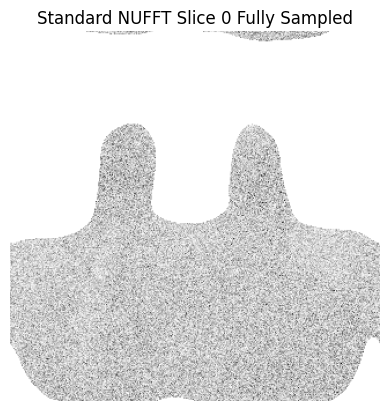

In [95]:
# Plot
plt.imshow(nufft_fs, cmap='gray_r')
plt.axis('off')
plt.title(f'Standard NUFFT Slice 0 Fully Sampled')
plt.show()

## NUFFT Recon Undersampled

In [96]:
undersampled_kspace_path = f'/ess/scratch/scratch1/rachelgordon/complex_undersampled/fastMRI_breast_001_1_undersampled.h5' 
f = h5py.File(undersampled_kspace_path, 'r')

original_kspace = f['kspace'][:].T

original_kspace = torch.tensor(original_kspace)

kspace_partition = original_kspace[0].reshape(16, 640*288, 2).unsqueeze(0).unsqueeze(-1)
kspace_partition = rearrange(kspace_partition, 'b c r i t -> b c i r t')

dtype = torch.float

# obtain dcf and k-sapce trajectory
N_coils, N_spokes, N_samples, N_time = 16, 288, 640, 1
base_res = N_samples // 2
traj = get_traj(N_spokes=N_spokes, N_time=N_time,
            base_res=base_res, gind=1)
print(traj.shape)



(184320, 1, 2)


In [97]:
undersampling_mask = f['mask'][:]
undersampling_mask = undersampling_mask[..., 0].reshape(2, 288*640, 16)
undersampling_mask = rearrange(np.expand_dims(undersampling_mask[..., 0], axis=0), 't i r -> r t i')
print(undersampling_mask.shape)

(184320, 1, 2)


In [98]:
traj = traj[undersampling_mask[:, 0, 0].astype(int)]
print(traj.shape)

(184320, 1, 2)


In [99]:
# Compute the DCF from traj
dcf = np.sqrt(traj[..., 0]**2 + traj[..., 1]**2)
dcomp_tensor = torch.tensor(dcf).unsqueeze(0).unsqueeze(0).unsqueeze(0) 


# combine real and imaginary components in k-space trajectory
traj = rearrange(traj, 't r i -> i t r')
traj = traj[0] + 1j * traj[1]
ktraj_tensor =  torch.stack([torch.tensor(traj.real),torch.tensor(traj.imag)],dim=0).unsqueeze(0)


# load and reshape coil sensitivity maps
csmaps = np.load(f'/ess/scratch/scratch1/rachelgordon/complex_fully_sampled/cs_maps/fastMRI_breast_001_1_cs_maps/cs_map_slice_{slice:03}.npy')
csmaps = np.squeeze(csmaps, axis=1)
csm_tensor = torch.stack([torch.tensor(csmaps.real),torch.tensor(csmaps.imag)],dim=1).unsqueeze(0) 

# flip cs maps so they are no longer upside down
csm_tensor = torch.flip(csm_tensor, dims=[-2])
csm_tensor = rearrange(csm_tensor, 'b c i h w -> b c h w i').to(dtype).contiguous()

#multiply k-space data with dcomp
dcomp_k_tensor = dcomp_tensor*kspace_partition
dcomp_k_tensor = dcomp_k_tensor.permute(0, 1, 3, 2, 4) # shape: (1, 12, 11520, 2, 20)

#apply adjoint
dcomp_k_tensor = dcomp_k_tensor.to(dtype)


#for each time point apply the adjoint NUFFT-operator;
AdjNUFFT = KbNufftAdjoint(im_size=(320, 320), grid_size=(640,640)).to(dtype)
xrec_list = [AdjNUFFT(dcomp_k_tensor[...,kt].contiguous(),
                ktraj_tensor[...,kt].to(dtype).contiguous(), smaps=csm_tensor, norm="ortho") for kt in range(1)] 

xrec_tensor = torch.stack(xrec_list,dim=-1)

xu = xrec_tensor.squeeze(0).squeeze(0).numpy()
xu = rearrange(xu, 'h w i t -> i h w t')
xu = np.abs(xu[0,...] + 1j*xu[1,...])

nufft_us = xu.squeeze()


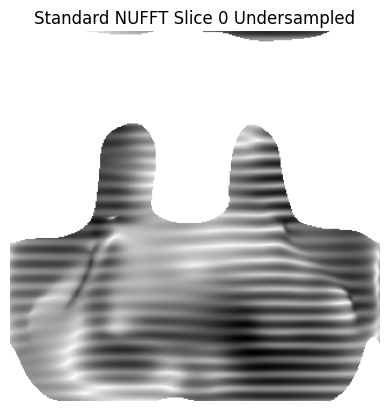

In [100]:
plt.imshow(xu.squeeze(), cmap='gray_r')
plt.axis('off')
plt.title(f'Standard NUFFT Slice 0 Undersampled')
plt.show()

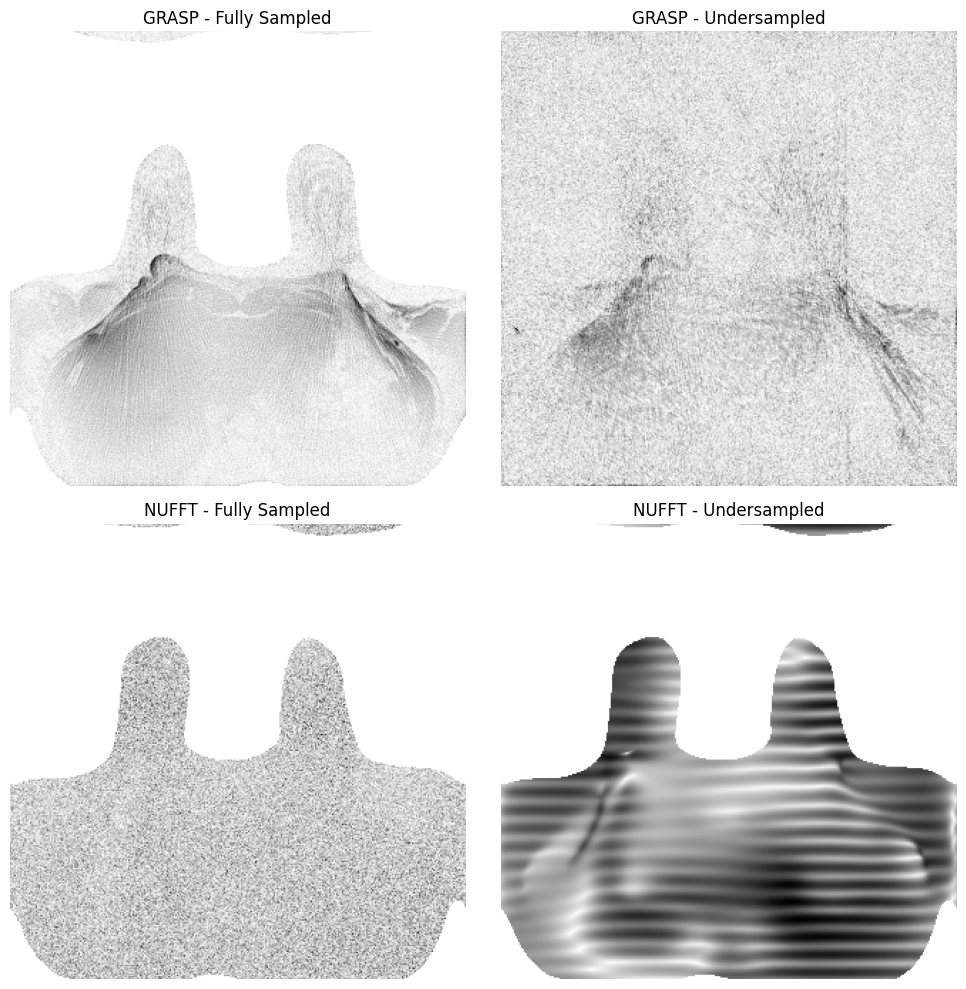

In [102]:
import matplotlib.pyplot as plt

# Create figure with 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Plot GRASP full
axes[0, 0].imshow(grasp_fs, cmap='gray_r')
axes[0, 0].set_title("GRASP - Fully Sampled")
axes[0, 0].axis('off')

# Plot GRASP undersampled
axes[0, 1].imshow(grasp_us, cmap='gray_r')
axes[0, 1].set_title("GRASP - Undersampled")
axes[0, 1].axis('off')

# Plot NUFFT full
axes[1, 0].imshow(nufft_fs, cmap='gray_r')
axes[1, 0].set_title("NUFFT - Fully Sampled")
axes[1, 0].axis('off')

# Plot NUFFT undersampled
axes[1, 1].imshow(nufft_us, cmap='gray_r')
axes[1, 1].set_title("NUFFT - Undersampled")
axes[1, 1].axis('off')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


# Plotting Images


float64
Image shape: (2, 320, 320)


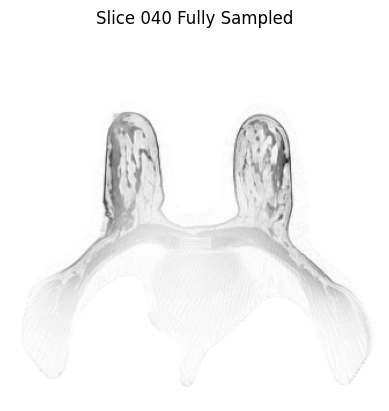

In [6]:
slice = '040'

# Load the NIfTI image
#nii_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_001_1/slice_{slice}_frame_000.nii' 
nii_path = f'/ess/scratch/scratch1/rachelgordon/complex_fully_sampled/fastMRI_breast_001_1/slice_{slice}_frame_000.nii' 
nii_image = nib.load(nii_path)


# Get the image data as a NumPy array
image_data = nii_image.get_fdata()

# real_part = image_data[..., 0]
# imag_part = image_data[..., 1]
complex_array = image_data[0] + 1j * image_data[1]

print(image_data.dtype)

# Check the shape of the image data
print("Image shape:", image_data.shape)

# Plot a specific slice (for a 3D volume, e.g., (x, y, z))
plt.imshow(np.abs(complex_array), cmap='gray_r')
plt.axis('off')
plt.title(f'Slice {slice} Fully Sampled')
plt.show()


In [8]:
# check DICOM 

file_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_001_1/slice_040_frame_000.dcm'

# Construct the file path for the current timeframe
dicom_file = pydicom.dcmread(file_path)
dicom_data = dicom_file.pixel_array
print(dicom_data.dtype)
print(dicom_data.shape)

AttributeError: Unable to convert the pixel data as the following conditionally required element is missing from the dataset: PlanarConfiguration

(320, 320, 2)
(320, 320)
Complex data shape: (320, 320)
Real part sample: 0.0
Imaginary part sample: 0.0


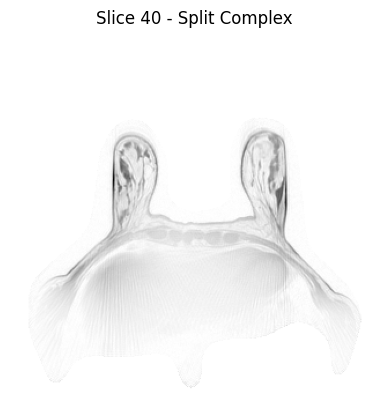

In [14]:
file_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_001_1/slice_040_frame_000.dcm'

# Construct the file path for the current timeframe
ds = pydicom.dcmread(file_path)

# Reconstruct the complex data
rows, cols = ds.Rows, ds.Columns
complex_data = np.frombuffer(ds.PixelData, dtype=np.float32).reshape(rows, cols, 2)
print(complex_data.shape)
real_part = complex_data[..., 0]
imag_part = complex_data[..., 1]
complex_array = real_part + 1j * imag_part

print(complex_array.shape)

print("Complex data shape:", complex_array.shape)
print("Real part sample:", real_part[0, 0])
print("Imaginary part sample:", imag_part[0, 0])

# Plot a specific slice (for a 3D volume, e.g., (x, y, z))
plt.imshow(np.abs(complex_array), cmap='gray_r')
plt.axis('off')
plt.title(f'Slice 40 - Split Complex')
plt.show()


In [14]:
print(dicom_file)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 206
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: MR Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.16.840.1.114151.3.1.12110394.10617572.21488.1579203286.79098
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.6
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_366'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'M', 'NORM', 'DIS2D']
(0008, 0012) Instance Creation Date              DA: ''
(0008, 0013) Instance Creation Time              TM: ''
(0008, 0016) SOP Class UID                       UI: MR Image Storage
(0008, 0018) S

In [19]:
def plot_timeframes_and_calibration(base_path, calibration_path, num_timeframes, slice=99):
    # Define the number of rows and columns based on the number of timeframes
    if num_timeframes == 2:
        n_rows, n_cols = 1, 3
    elif num_timeframes == 4:
        n_rows, n_cols = 1, 5
    elif num_timeframes == 8:
        n_rows, n_cols = 3, 3
    elif num_timeframes == 16:
        n_rows, n_cols = 4, 5
    elif num_timeframes == 32:
        n_rows, n_cols = 4, 9
    elif num_timeframes == 48:
        n_rows, n_cols = 6,9
    else:
        raise ValueError("Unsupported number of timeframes")

    # Create a subplot with the appropriate number of rows and columns
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(64, 12))
    fig.suptitle(f'Calibration + DCE-MRI ({num_timeframes} TF)', fontsize=36)  # Increase the font size of the suptitle

    calibration_path = Path(calibration_path) / f'slice_{slice:03d}_frame_000.nii'
    if not calibration_path.exists():
        print(f"File not found: {calibration_path}")

    calibration_image = nib.load(calibration_path)
    calibration_data = calibration_image.get_fdata()

    # Plot the image
    ax = axes[0]
    ax.imshow(calibration_data, cmap='gray_r')
    ax.set_title(f'Calibration Scan', fontsize=36)  # Increase the font size of titles
    ax.axis('off')

    for t in range(num_timeframes):
        # Construct the file path for the current timeframe
        file_path = Path(base_path) / f'slice_{slice:03d}_frame_{t:03d}.nii'
        if not file_path.exists():
            print(f"File not found: {file_path}")
            continue

        # Load the file
        nii_image = nib.load(file_path)
        image_data = nii_image.get_fdata()


        # Determine the position in the subplot grid
        row = (t + 1) // n_cols
        col = (t + 1) % n_cols

        # Plot the image
        ax = axes[row, col] if num_timeframes > 4 else axes[col]
        ax.imshow(image_data, cmap='gray_r')
        ax.set_title(f'Frame {t}', fontsize=36)  # Increase the font size of titles
        ax.axis('off')

    # Adjust layout and save the figure
    #plt.tight_layout(pad=1.0, rect=[0, 0, 1, 0.96])  # Leave space for the suptitle; adjust padding to reduce white space
    plt.show()

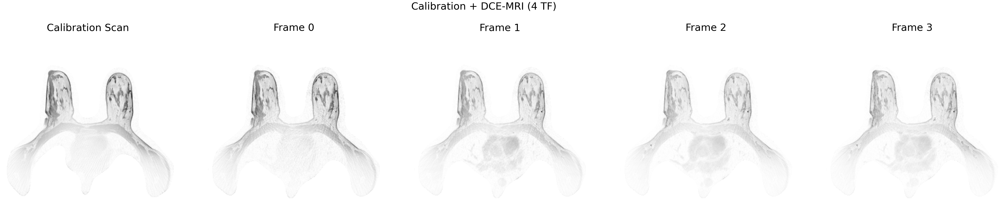

In [20]:
# plot timeframes
num_timeframes = 4
base_path = f'/ess/scratch/scratch1/rachelgordon/reconresnet/fully_sampled_gt/fastMRI_breast_001_2'
calibration_path = f'/ess/scratch/scratch1/rachelgordon/pre-contrast-1tf/fastMRI_breast_001_1'
plot_timeframes_and_calibration(base_path, calibration_path, num_timeframes)

In [2]:
# check DICOM metadata for temporal resolution

base_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_2_DCM'

# Construct the file path for the current timeframe
file_path = Path(base_path) / f'slice_098_frame_001.dcm'
dicom_file = pydicom.dcmread(file_path)

# Define keywords to search for
keywords = ["time", "temporal", "resolution"]

# Search for attributes containing the keywords
print("Attributes containing keywords 'time', 'temporal', or 'resolution':")
for elem in dicom_file.iterall():
    if any(keyword in elem.name.lower() for keyword in keywords):
        print(f"{elem.tag}: {elem.name} - {elem.value}")

# Frame 0: 170449.960411
# Frame 1: 170527.460411
# Frame 2: 170604.960411
# Frame 3: 170642.460411 (same across slices)

Attributes containing keywords 'time', 'temporal', or 'resolution':
(0008, 0013): Instance Creation Time - 
(0008, 0030): Study Time - 
(0008, 0031): Series Time - 
(0008, 0032): Acquisition Time - 170527.460411
(0008, 0033): Content Time - 170527.460411
(0018, 0080): Repetition Time - 4.87
(0018, 0081): Echo Time - 1.8
(0040, 0245): Performed Procedure Step Start Time - 


In [4]:
def get_acq_time(base_path, frame_num, slice = 99):

    file_path = Path(base_path) / f'slice_{slice:03d}_frame_{frame_num:03d}.dcm'
    dicom_file = pydicom.dcmread(file_path)

    # Extract Acquisition Time
    acquisition_time = dicom_file.get("AcquisitionTime", None)

    file_path_0 = Path(base_path) / f'slice_{slice:03d}_frame_000.dcm'
    dicom_file_0 = pydicom.dcmread(file_path_0)
    
    # Extract Acquisition Time for each frame
    acquisition_time_0 = dicom_file_0.get("AcquisitionTime", None)
    
    acquisition_time = float(acquisition_time)
    acquisition_time_0 = float(acquisition_time_0)

    return acquisition_time - acquisition_time_0

In [39]:
def plot_timeframes(base_path, num_timeframes, slice=99):
    # Define the number of rows and columns based on the number of timeframes
    if num_timeframes == 2:
        n_rows, n_cols = 1, 2
    elif num_timeframes == 4:
        n_rows, n_cols = 2, 2
    elif num_timeframes == 8:
        n_rows, n_cols = 2, 4
    elif num_timeframes == 16:
        n_rows, n_cols = 4, 4
    elif num_timeframes == 32:
        n_rows, n_cols = 4, 8
    elif num_timeframes == 48:
        n_rows, n_cols = 6, 8
    else:
        raise ValueError("Unsupported number of timeframes")

    # Create a subplot with the appropriate number of rows and columns
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    fig.suptitle(f'{num_timeframes} Timeframes', fontsize=20)  # Increase the font size of the suptitle

    for t in range(num_timeframes):
        # Construct the file path for the current timeframe
        file_path = Path(base_path) / f'slice_{slice:03d}_frame_{t:03d}.dcm'
        if not file_path.exists():
            print(f"File not found: {file_path}")
            continue

        # Load the DICOM file
        dicom_data = pydicom.dcmread(file_path)
        image_data = dicom_data.pixel_array

        # Determine the position in the subplot grid
        row = t // n_cols
        col = t % n_cols

        # Plot the image
        ax = axes[row, col] if num_timeframes > 2 else axes[col]
        ax.imshow(image_data, cmap='gray_r')
        ax.set_title(f'Frame {t}', fontsize=20)  # Increase the font size of titles
        ax.axis('off')

    # Adjust layout and save the figure
    plt.tight_layout(pad=1.0, rect=[0, 0, 1, 0.96])  # Leave space for the suptitle; adjust padding to reduce white space
    plt.show()

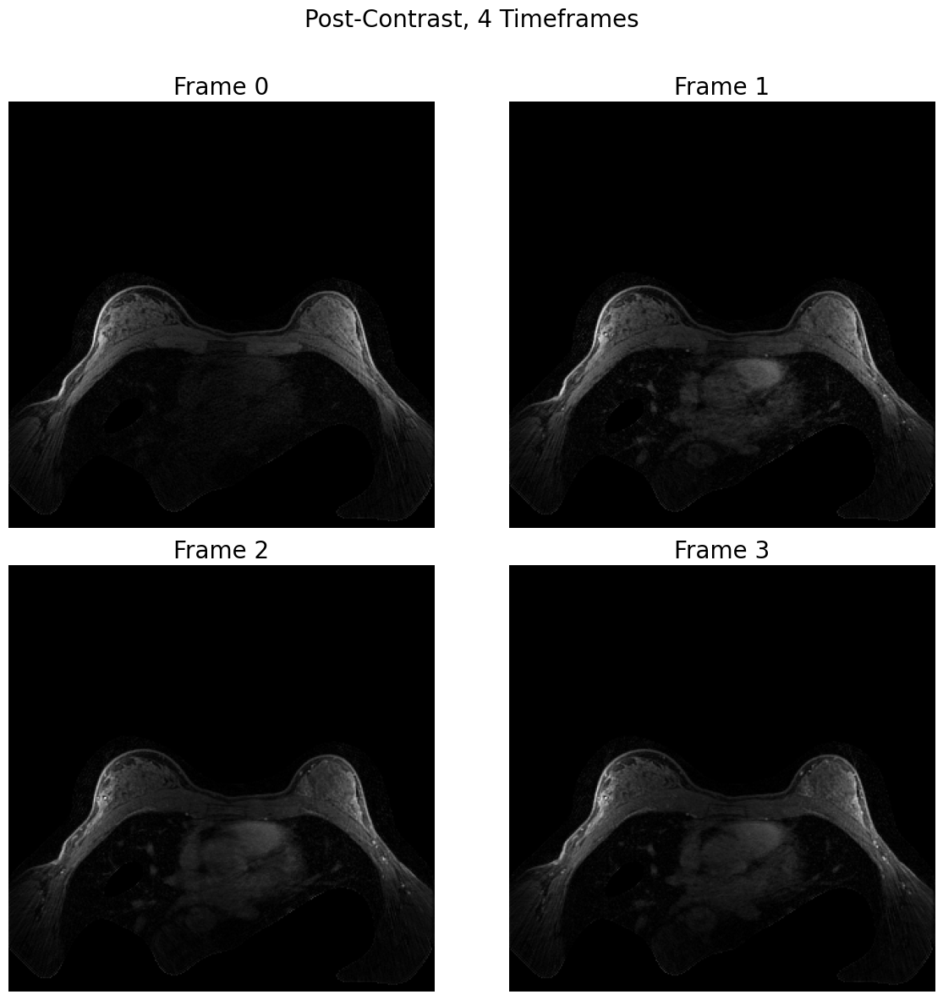

In [21]:
# plot timeframes
num_timeframes = 4
base_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_data/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_008_2_DCM/'
plot_timeframes(base_path, num_timeframes)

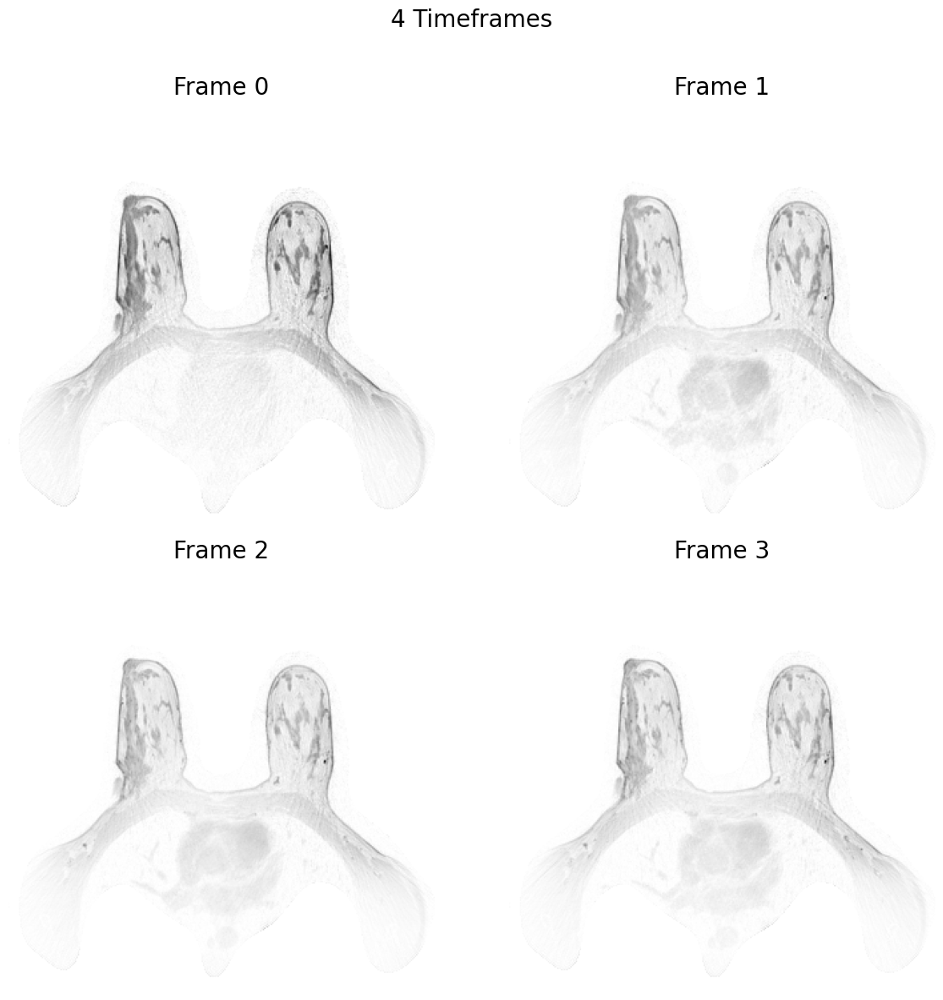

In [40]:
# plot timeframes
num_timeframes = 4
base_path = f'/ess/scratch/scratch1/rachelgordon/MRI_001_2_variable_tf/fastMRI_breast_001_2_DCM_processed_{num_timeframes}tf'
plot_timeframes(base_path, num_timeframes)

In [6]:
def subtract_nth_most_recent_frame(frame_idx, num_timeframes, n, slice = 99, to_plot=False):

    frame_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_{num_timeframes}tf/slice_{slice:03d}_frame_{frame_idx:03d}.dcm'
    frame_dicom = pydicom.dcmread(frame_path)
    frame_data = frame_dicom.pixel_array

    recent_frame_idx = frame_idx - n
    
    if recent_frame_idx >= 0:
        
        recent_frame_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_{num_timeframes}tf/slice_{slice:03d}_frame_{recent_frame_idx:03d}.dcm'
        recent_frame_dicom = pydicom.dcmread(recent_frame_path)
        recent_frame_data = recent_frame_dicom.pixel_array

        subtr = frame_data - recent_frame_data

        if to_plot:
            plt.imshow(subtr, cmap='gray_r')
            plt.title(f"Subtraction: Frame {frame_idx} - Frame {recent_frame_idx}")
            plt.show()
        
        return subtr
    
    else:
        if to_plot:
            plt.imshow(frame_data, cmap='gray_r')
            plt.title(f"Frame {frame_idx}")
            plt.show()

        return frame_data


In [7]:
def plot_subtractions(base_path, num_timeframes, n_recent_frame=1, slice=99):
    # Define the number of rows and columns based on the number of timeframes
    if num_timeframes == 2:
        n_rows, n_cols = 1, 2
    elif num_timeframes == 4:
        n_rows, n_cols = 2, 2
    elif num_timeframes == 8:
        n_rows, n_cols = 2, 4
    elif num_timeframes == 16:
        n_rows, n_cols = 4, 4
    elif num_timeframes == 32:
        n_rows, n_cols = 4, 8
    elif num_timeframes == 48:
        n_rows, n_cols = 6, 8
    else:
        raise ValueError("Unsupported number of timeframes. Only 2, 4, or 8 are supported.")

    # Create a subplot with the appropriate number of rows and columns
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 16))
    if n_recent_frame == 1:
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting {n_recent_frame}st Most Recent Frame)')
    elif n_recent_frame == 2:
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting {n_recent_frame}nd Most Recent Frame)')
    elif n_recent_frame == 3:
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting {n_recent_frame}rd Most Recent Frame)')
    else: 
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting {n_recent_frame}th Most Recent Frame)')

    for t in range(num_timeframes):

        image_data = subtract_nth_most_recent_frame(t, num_timeframes, n_recent_frame, slice)

        acq_time = get_acq_time(base_path, t, slice)

        # Determine the position in the subplot grid
        row = t // n_cols
        col = t % n_cols

        # Plot the image
        ax = axes[row, col] if num_timeframes > 2 else axes[col]
        ax.imshow(image_data, cmap='gray_r')
        ax.set_title(f'{acq_time} seconds')
        ax.axis('off')

    # Adjust layout and save the figure
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the suptitle
    #plt.savefig(Path(base_path) / f'dicom_slices_{num_timeframes}.png')
    plt.show()

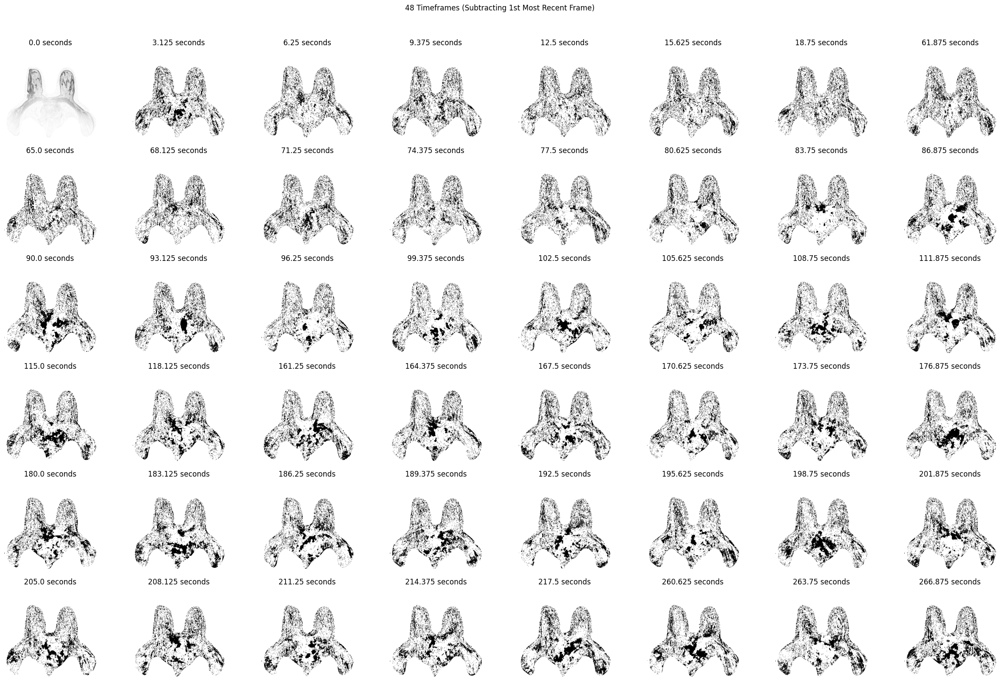

In [18]:
# plot subtractions
num_timeframes = 48
base_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_{num_timeframes}tf'
plot_subtractions(base_path, num_timeframes, n_recent_frame=1)

In [8]:
def avg_images(timeframes, frame_idx, nth_recent_frame, frames_to_avg, slice = 99, to_plot=False):

    base_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_{timeframes}tf'

    frames_data = []
    start_idx = frame_idx - nth_recent_frame
    for t in range(start_idx, start_idx + frames_to_avg):
        file_path = os.path.join(base_path, f'slice_{slice:03d}_frame_{t:03d}.dcm')
        dicom_file = pydicom.dcmread(file_path)
        dicom_data = dicom_file.pixel_array
        frames_data.append(dicom_data)
    
    avg = np.sum(frames_data, axis=0) / len(frames_data)

    if to_plot:
        plt.imshow(avg, cmap='gray_r')
        plt.title(f"Average of {frames_to_avg} Frames Starting with Frame {start_idx}")
        plt.show()

    return avg

In [16]:
def plot_average_subtractions(base_path, num_timeframes, nth_recent_frame, frames_to_avg, slice = 99):
    # Define the number of rows and columns based on the number of timeframes
    if num_timeframes == 2:
        n_rows, n_cols = 1, 2
    elif num_timeframes == 4:
        n_rows, n_cols = 2, 2
    elif num_timeframes == 8:
        n_rows, n_cols = 2, 4
    elif num_timeframes == 16:
        n_rows, n_cols = 4, 4
    elif num_timeframes == 32:
        n_rows, n_cols = 4, 8
    elif num_timeframes == 48:
        n_rows, n_cols = 6, 8
    else:
        raise ValueError("Unsupported number of timeframes.")

    # Create a subplot with the appropriate number of rows and columns
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 16))
    if nth_recent_frame == 1:
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting Average of {frames_to_avg} Frames Starting with {nth_recent_frame}st Most Recent Frame)')
    elif nth_recent_frame == 2:
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting Average of {frames_to_avg} Frames Starting with {nth_recent_frame}nd Most Recent Frame)')
    elif nth_recent_frame == 3:
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting Average of {frames_to_avg} Frames Starting with {nth_recent_frame}rd Most Recent Frame)')
    else: 
        fig.suptitle(f'{num_timeframes} Timeframes (Subtracting Average of {frames_to_avg} Frames Starting with {nth_recent_frame}th Most Recent Frame)')

    for t in range(num_timeframes):
        # Construct the file path for the current timeframe
        file_path = Path(base_path) / f'slice_{slice:03d}_frame_{t:03d}.dcm'
        if not file_path.exists():
            print(f"File not found: {file_path}")
            continue

        # Load the DICOM file
        dicom_data = pydicom.dcmread(file_path)
        image_data = dicom_data.pixel_array

        # frames_to_avg must be less than or equal to nth_recent_frame
        if t - nth_recent_frame >= 0:
            if frames_to_avg <= nth_recent_frame:
                avg_image_data = avg_images(num_timeframes, t, nth_recent_frame, frames_to_avg, slice, to_plot=False)

                subtraction_image = image_data - avg_image_data

                # Plot the subtraction image
                plt.figure(figsize=(6, 6))
                plt.imshow(subtraction_image, cmap='gray_r')
                plt.title(f'{acq_time} seconds')
                plt.axis('off') 

                label = str(acq_time).replace('.', '_')
                plt.savefig(f'{num_timeframes}tf_{label}seconds.png')

                acq_time = get_acq_time(base_path, t, slice)

                # Determine the position in the subplot grid
                row = t // n_cols
                col = t % n_cols

                # Plot the image
                ax = axes[row, col] if num_timeframes > 2 else axes[col]
                ax.imshow(subtraction_image, cmap='gray_r')
                ax.set_title(f'{acq_time} seconds')
                ax.axis('off')

            else:
                raise ValueError("Frames to Average must be less than or equal to Nth Recent Frame.")
        else:
        
            acq_time = get_acq_time(base_path, t, slice)

            # Determine the position in the subplot grid
            row = t // n_cols
            col = t % n_cols

            # Plot the image
            ax = axes[row, col] if num_timeframes > 2 else axes[col]
            ax.imshow(image_data, cmap='gray_r')
            ax.set_title(f'{acq_time} seconds')
            ax.axis('off')

    # Adjust layout and save the figure
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the suptitle
    #plt.savefig(Path(base_path) / f'dicom_slices_{num_timeframes}.png')
    plt.show()

/tmp/ipykernel_5243/3440891901.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 6))


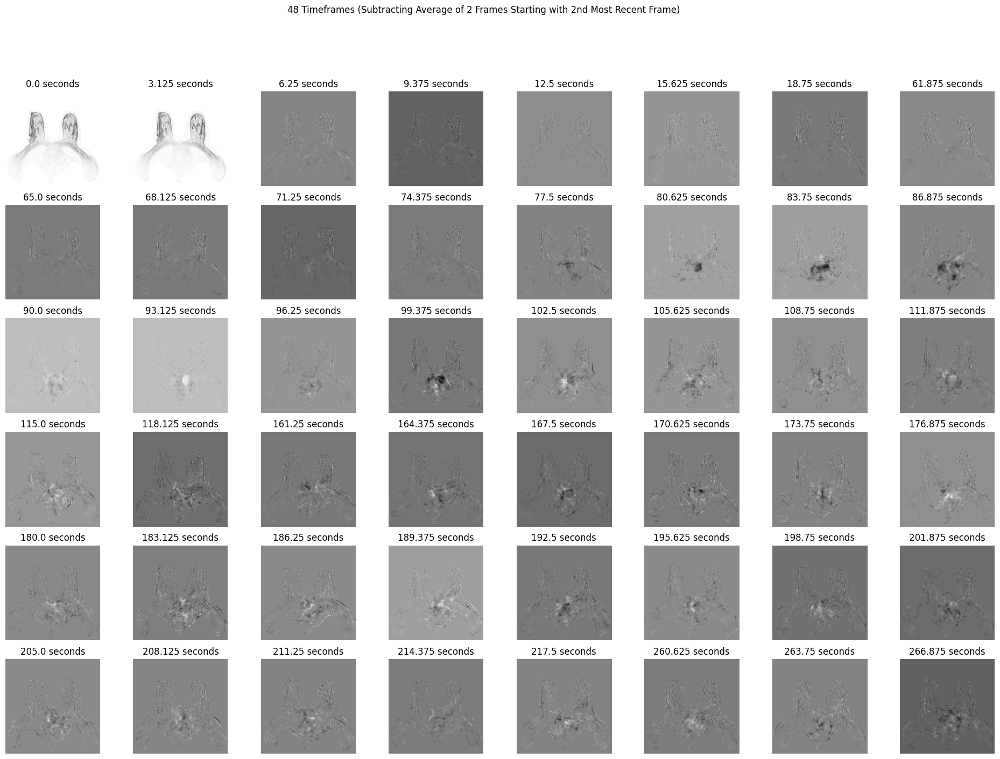

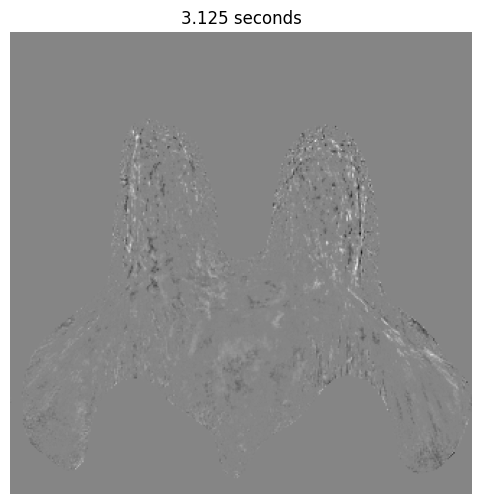

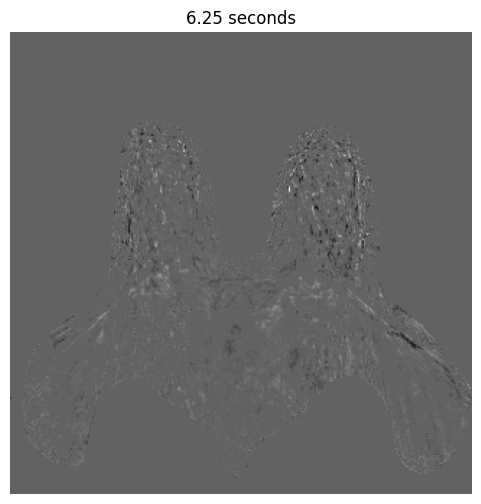

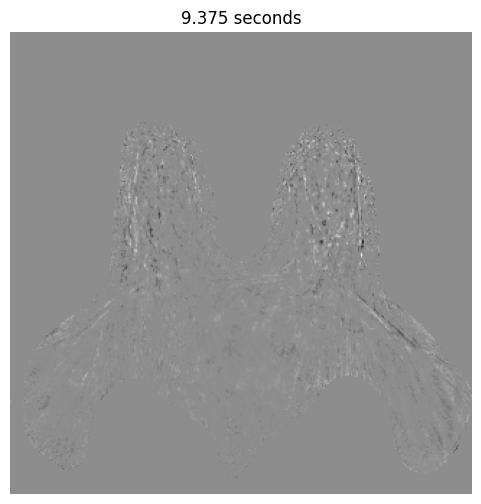

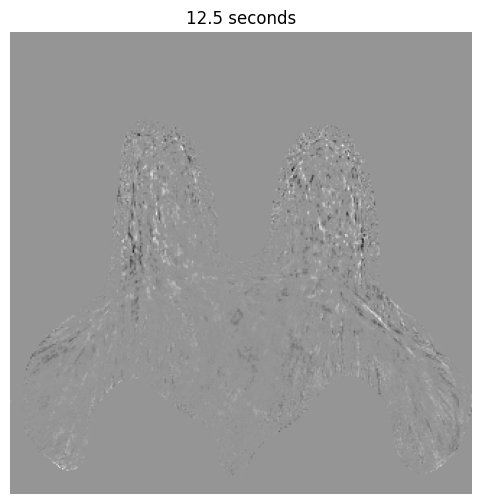

...

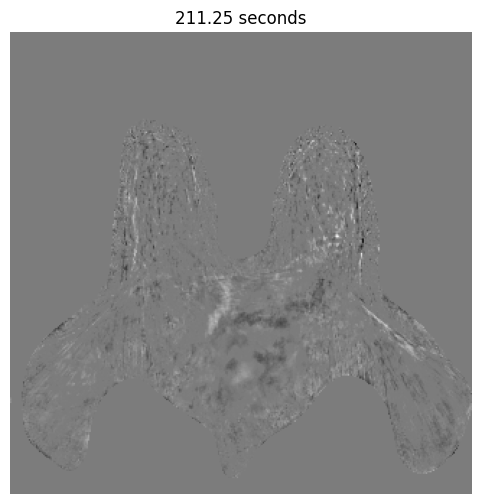

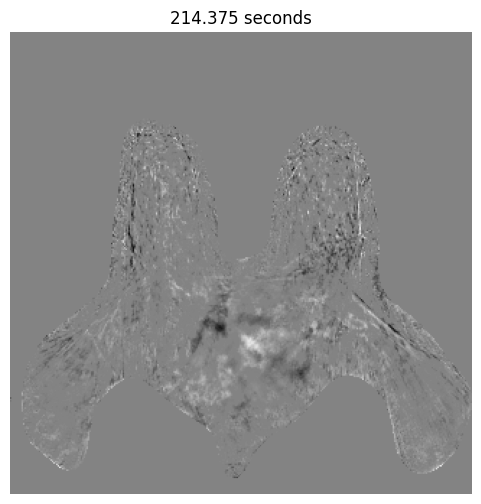

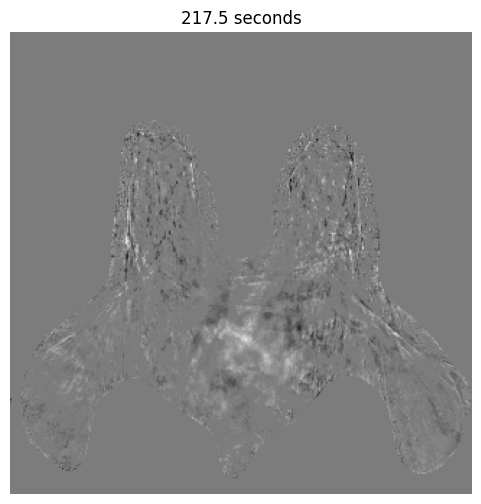

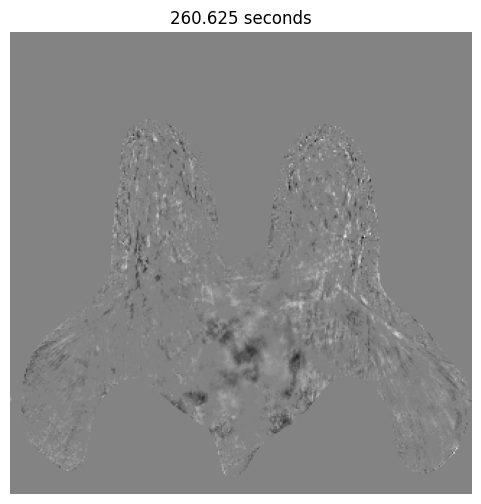

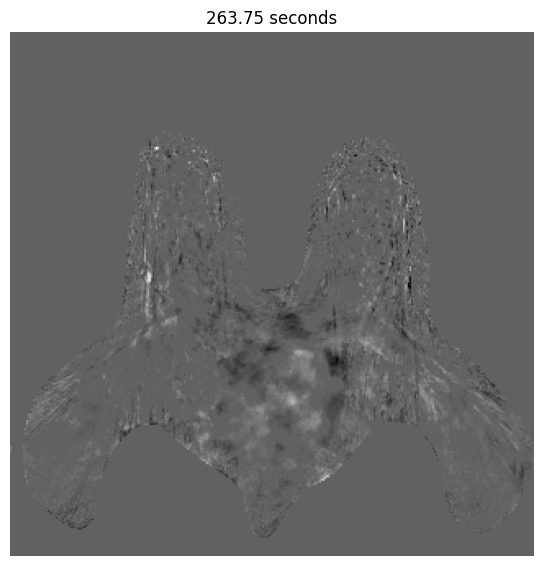

In [17]:
# plot average subtractions
num_timeframes = 48
base_path = f'/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_{num_timeframes}tf'
plot_average_subtractions(base_path, num_timeframes, nth_recent_frame=2, frames_to_avg=2)

In [2]:

def plot_dicom_slices(base_path, num_timeframes):
    # Define the number of rows and columns based on the number of timeframes
    if num_timeframes == 2:
        n_rows, n_cols = 1, 2
    elif num_timeframes == 4:
        n_rows, n_cols = 2, 2
    elif num_timeframes == 8:
        n_rows, n_cols = 2, 4
    else:
        raise ValueError("Unsupported number of timeframes. Only 2, 4, or 8 are supported.")

    # Load frame 0 data
    file_path_0 = Path(base_path) / 'slice_099_frame_000.dcm'
    if not file_path_0.exists():
        print(f"File not found: {file_path_0}")
        return
    dicom_data_0 = pydicom.dcmread(file_path_0)
    frame_0_data = dicom_data_0.pixel_array

    # Create a subplot with the appropriate number of rows and columns
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 8))
    fig.suptitle(f'{num_timeframes} Timeframes (Subtracted from Frame 0)')

    for t in range(num_timeframes):
        # Construct the file path for the current timeframe
        file_path = Path(base_path) / f'slice_099_frame_{t:03d}.dcm'
        if not file_path.exists():
            print(f"File not found: {file_path}")
            continue

        # Load the DICOM file
        dicom_data = pydicom.dcmread(file_path)
        image_data = dicom_data.pixel_array

        # Subtract frame 0 from the current frame if t > 0
        if t > 0 and num_timeframes > 2:
            image_data = image_data - frame_0_data

        # Determine the position in the subplot grid
        row = t // n_cols
        col = t % n_cols

        # Plot the image
        ax = axes[row, col] if num_timeframes > 2 else axes[col]
        ax.imshow(image_data, cmap='gray_r')
        ax.set_title(f'Frame {t} - Frame 0' if t > 0 else 'Frame 0')
        ax.axis('off')

    # Adjust layout and save the figure
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the suptitle
    plt.savefig(Path(base_path) / f'dicom_slices_{num_timeframes}_subtracted.png')
    plt.show()

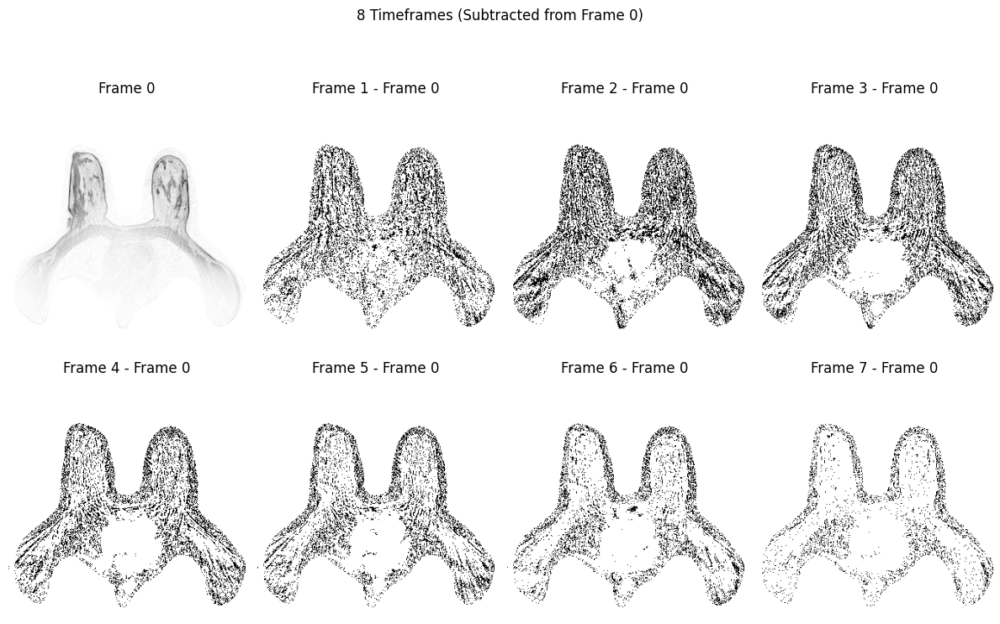

In [3]:
# plot 8 timeframes
base_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_8tf'
num_timeframes = 8  # Change this to 2 or 4 as needed
plot_dicom_slices(base_path, num_timeframes)

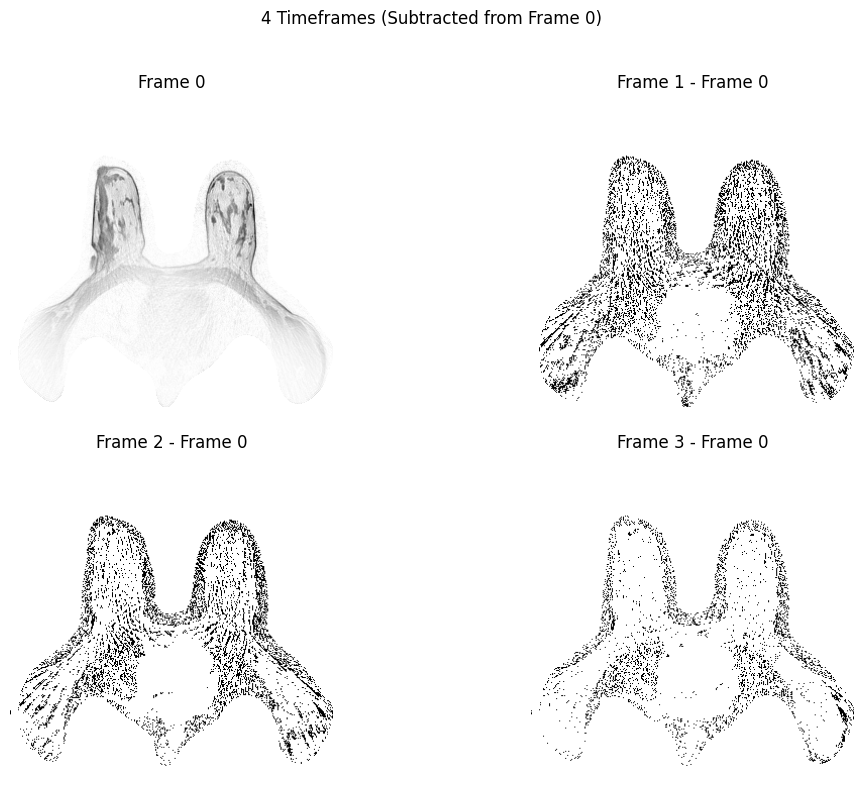

In [4]:
# plot 4 timeframes
base_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_4tf'
num_timeframes = 4
plot_dicom_slices(base_path, num_timeframes)

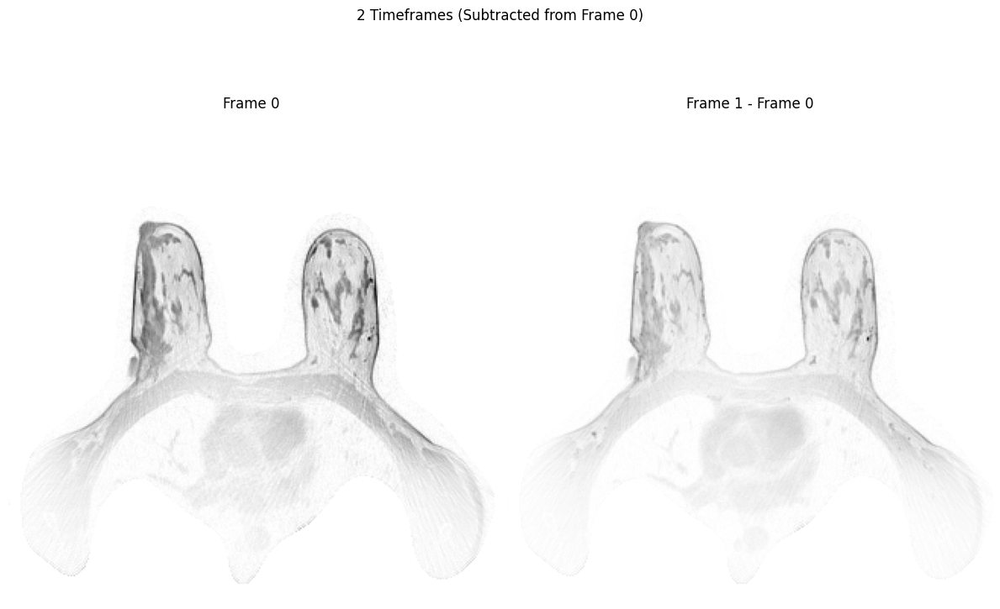

In [5]:
# plot 2 timeframes
base_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_DCM_processed_2tf'
num_timeframes = 2
plot_dicom_slices(base_path, num_timeframes)

In [2]:
def compare_dcm_nii(dcm_file, nifti_file, title, out_dir="."):
    
    # Load the DICOM files
    dicom_img = pydicom.dcmread(dcm_file)
    nifti_img = nib.load(nifti_file)
    
    # Extract the pixel arrays (image data)
    dicom_data = dicom_img.pixel_array
    nifti_data = nifti_img.get_fdata()

    print("Original Image Shape: ", dicom_data.shape)
    print("New Image Shape: ", nifti_data.shape)
    
    # Create a subplot with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(title)
    
    # Display the original slice
    axes[0].imshow(dicom_data, cmap='gray_r')
    axes[0].set_title('Fully Sampled Slice')
    axes[0].axis('off')  # Hide axis
    
    # Display the new slice
    axes[1].imshow(nifti_data, cmap='gray_r')
    axes[1].set_title('Undersampled Slice')
    axes[1].axis('off')  # Hide axis


    
    # Save the figure
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust to fit the title
    plt.savefig(Path(out_dir) / f"{title.replace(' ', '_')}.png")
    plt.show()

Original Image Shape:  (320, 320)
New Image Shape:  (320, 320)


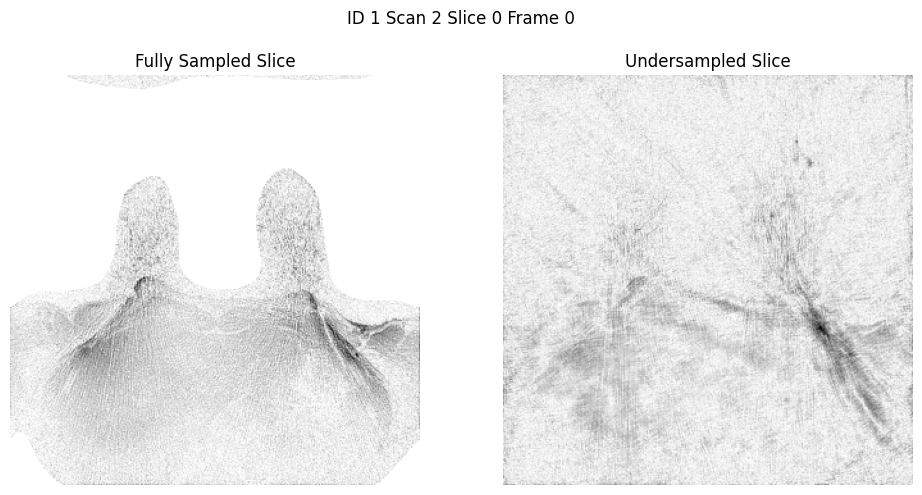

In [4]:
dcm_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_2_DCM/slice_000_frame_000.dcm'
nifti_path = '/ess/scratch/scratch1/rachelgordon/reconresnet/undersampled_input_29sp/fastMRI_breast_001_2/slice_000_frame_000.nii'

compare_dcm_nii(dcm_path, nifti_path, "ID 1 Scan 2 Slice 0 Frame 0")

Original Image Shape:  (320, 320)
New Image Shape:  (320, 320)


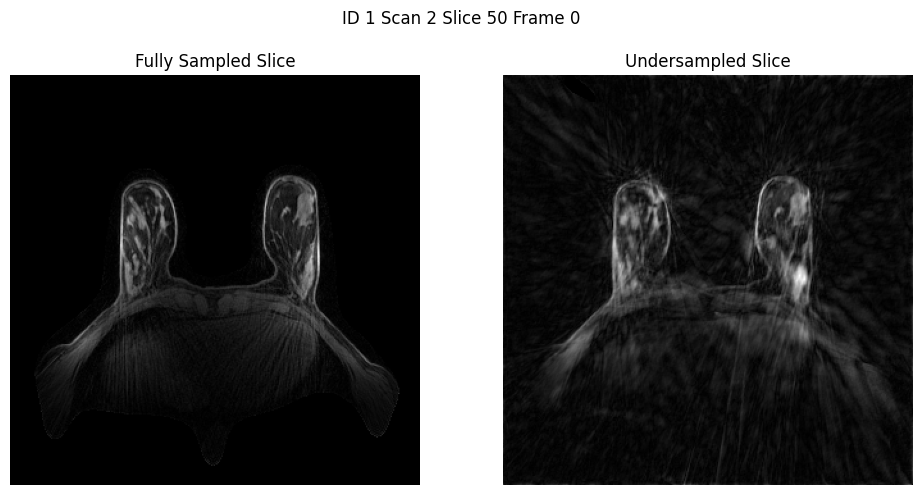

In [42]:
dcm_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_2_DCM/slice_050_frame_000.dcm'
nifti_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_NIFTI_processed_us_29sp/slice_050_frame_000.nii'

compare_dcm_nii(dcm_path, nifti_path, "ID 1 Scan 2 Slice 50 Frame 0")

Original Image Shape:  (320, 320)
New Image Shape:  (320, 320)


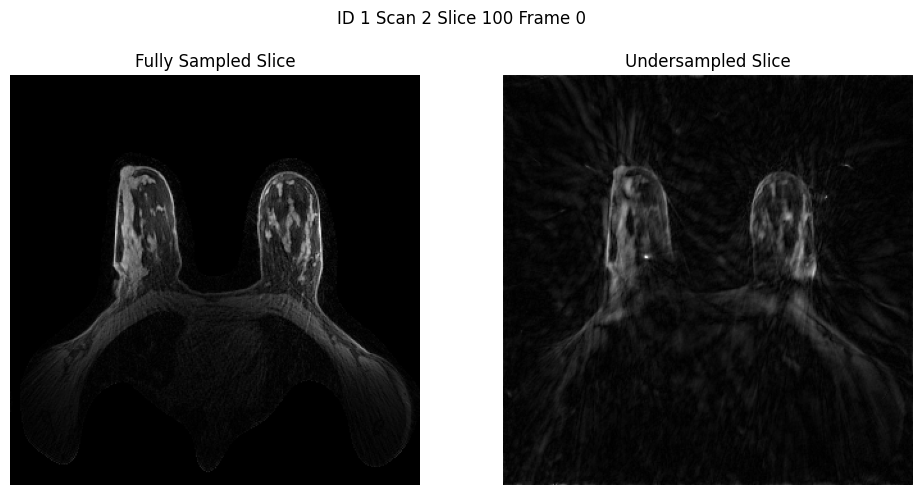

In [43]:
dcm_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_2_DCM/slice_100_frame_000.dcm'
nifti_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_010/fastMRI_breast_001_2_NIFTI_processed_us_29sp/slice_100_frame_000.nii'

compare_dcm_nii(dcm_path, nifti_path, "ID 1 Scan 2 Slice 100 Frame 0")

In [2]:
def compare_slices(original_slice_path, new_slice_path, title, out_dir="."):
    
    # Load the DICOM files
    original_dicom_data = pydicom.dcmread(original_slice_path)
    new_dicom_data = pydicom.dcmread(new_slice_path)
    
    # Extract the pixel arrays (image data)
    original_image_data = original_dicom_data.pixel_array
    new_image_data = new_dicom_data.pixel_array

    print("Original Image Shape: ", original_image_data.shape)
    print("New Image Shape: ", new_image_data.shape)
    
    # Create a subplot with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(title)
    
    # Display the original slice
    axes[0].imshow(original_image_data, cmap='gray')
    axes[0].set_title('Fully Sampled Slice')
    axes[0].axis('off')  # Hide axis
    
    # Display the new slice
    axes[1].imshow(new_image_data, cmap='gray')
    axes[1].set_title('Undersampled Slice')
    axes[1].axis('off')  # Hide axis


    
    # Save the figure
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust to fit the title
    plt.savefig(Path(out_dir) / f"{title.replace(' ', '_')}.png")
    plt.show()

Original Image Shape:  (320, 320)
New Image Shape:  (320, 320)


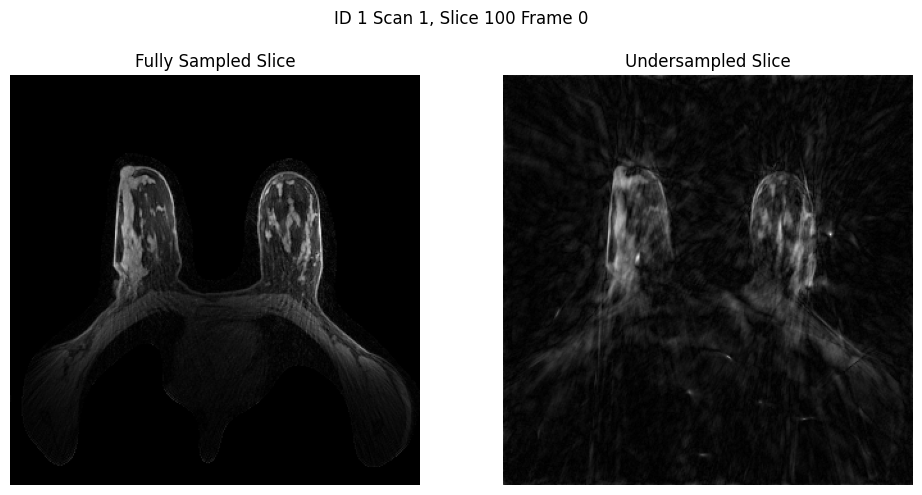

In [5]:
original_slice_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_1_DCM/slice_100_frame_000.dcm'
new_slice_path = '/gpfs/data/karczmar-lab/workspaces/rachelgordon/demo_dce_recon/undersampled_kspace_data/undersampled_kspace_data_DCM_processed/slice_100_frame_000.dcm'

compare_slices(original_slice_path, new_slice_path, "ID 1 Scan 1, Slice 100 Frame 0")

Original Image Shape:  (320, 320)
New Image Shape:  (320, 320)


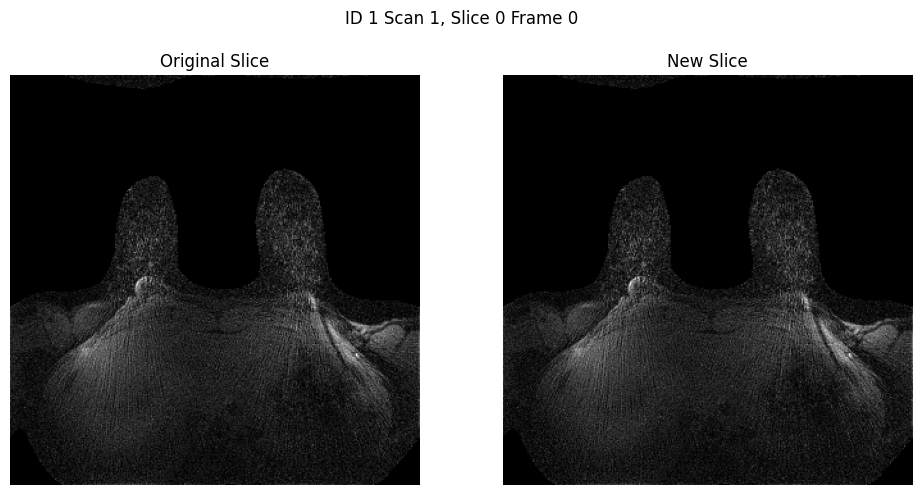

In [9]:
original_slice_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_1_DCM/slice_000_frame_000.dcm'
new_slice_path = '/gpfs/data/karczmar-lab/workspaces/rachelgordon/demo_dce_recon/fastMRI_breast_001_1/fastMRI_breast_001_1_DCM_processed/slice_000_frame_000.dcm'

compare_slices(original_slice_path, new_slice_path, "ID 1 Scan 1, Slice 0 Frame 0")

Original Image Shape:  (320, 320)
New Image Shape:  (320, 320)


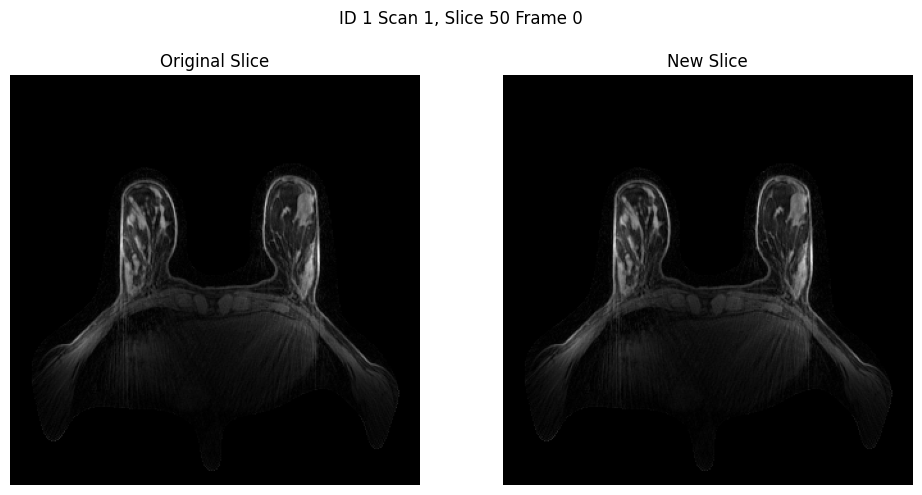

In [10]:
original_slice_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_1_DCM/slice_050_frame_000.dcm'
new_slice_path = '/gpfs/data/karczmar-lab/workspaces/rachelgordon/demo_dce_recon/fastMRI_breast_001_1/fastMRI_breast_001_1_DCM_processed/slice_050_frame_000.dcm'

compare_slices(original_slice_path, new_slice_path, "ID 1 Scan 1, Slice 50 Frame 0")

Original Image Shape:  (320, 320)
New Image Shape:  (320, 320)


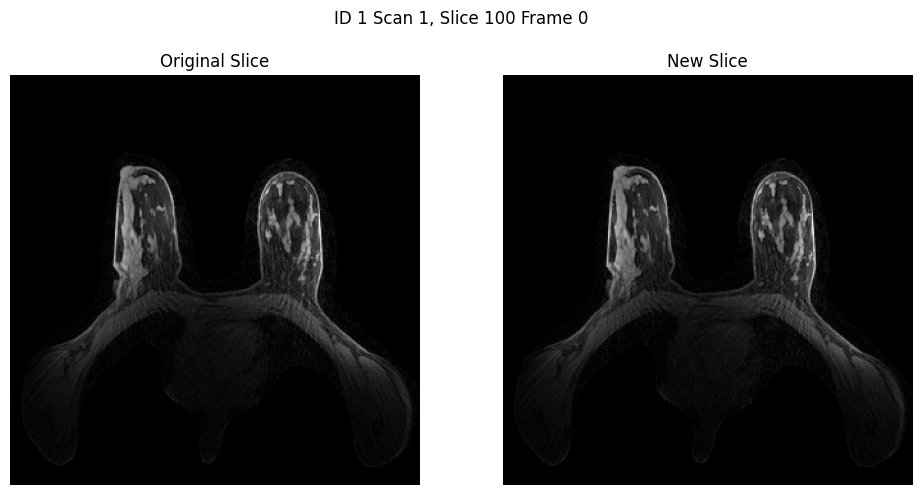

In [11]:
original_slice_path = '/ess/scratch/scratch1/rachelgordon/fastMRI_breast_IDS_001_150_DCM/fastMRI_breast_001_1_DCM/slice_100_frame_000.dcm'
new_slice_path = '/gpfs/data/karczmar-lab/workspaces/rachelgordon/demo_dce_recon/fastMRI_breast_001_1/fastMRI_breast_001_1_DCM_processed/slice_100_frame_000.dcm'

compare_slices(original_slice_path, new_slice_path, "ID 1 Scan 1, Slice 100 Frame 0")

In [16]:
# Load Raw Data

'''
kspace (2, 288, 640, 16, 83):

* 2: real and imaginary parts of complex data
* 288: Radial measurements (x-direction, number of spokes)
* 640: Radial measurements (y-direction, number of samples per spoke)
* 16: Number of coils
* 83: Partitions along z-axis

temptv (192, 4, 320, 320):

* 192: Number of slices
* 4: Number of time frames
* 320: Height of each image
* 320: Width of each image

'''

import h5py

# Path to the HDF5 file
file_path = '/gpfs/data/karczmar-lab/workspaces/rachelgordon/demo_dce_recon/fastMRI_breast_001_1/fastMRI_breast_001_1.h5'

# Open the HDF5 file
with h5py.File(file_path, 'r') as f:
    # Load the datasets
    kspace = f['kspace'][:]
    temptv = f['temptv'][:]

# Now kspace and temptv are numpy arrays containing the data
print("kspace shape:", kspace.shape)
print("temptv shape:", temptv.shape)

kspace shape: (2, 288, 640, 16, 83)
temptv shape: (192, 4, 320, 320)


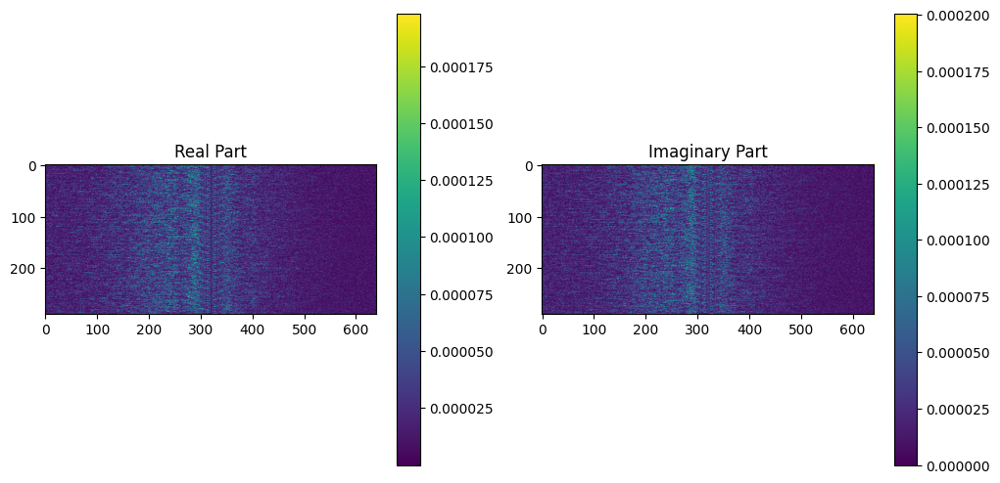

In [17]:
# Plot real and imaginary k-space data

real_part = kspace[0, :, :, :, :]  # Extract real part
imaginary_part = kspace[1, :, :, :, :]  # Extract imaginary part

# Example indices
coil_index = 0
partition_index = 0

# Plot real part of k-space for the first coil and partition
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(np.abs(real_part[:, :, coil_index, partition_index]))
plt.title('Real Part')
plt.colorbar()

# Plot imaginary part of k-space for the first coil and partition
plt.subplot(1, 2, 2)
plt.imshow(np.abs(imaginary_part[:, :, coil_index, partition_index]))
plt.title('Imaginary Part')
plt.colorbar()

plt.show()


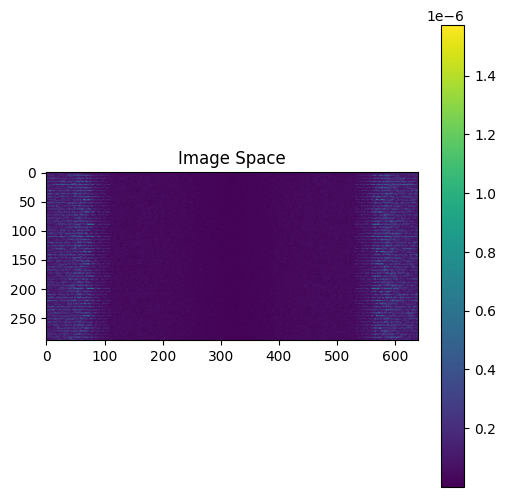

In [18]:
# Perform FFT and plot image space

from scipy.fft import ifft2, ifftshift

# Example indices
coil_index = 0
partition_index = 0

# Extract k-space data for a single coil and partition
kspace_single = kspace[:, :, :, coil_index, partition_index]

# Combine real and imaginary parts
kspace_combined = kspace_single[0] + 1j * kspace_single[1]

# Apply inverse FFT to get image space
image_space = np.fft.ifft2(kspace_combined)

# Plot magnitude of the image space
plt.figure(figsize=(6, 6))
plt.imshow(np.abs(image_space))
plt.title('Image Space')
plt.colorbar()
plt.show()


In [22]:
print(kspace.shape)

(2, 288, 640, 16, 83)


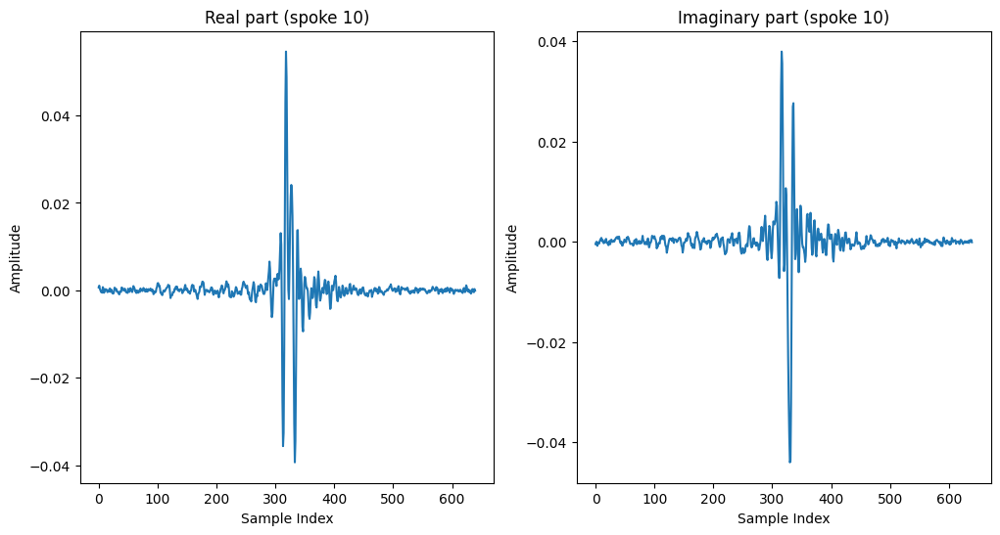

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming kspace has dimensions (2, 288, 640, 16, 83)
# and kspace[0, :, :, :, :] is the real part
# and kspace[1, :, :, :, :] is the imaginary part

def plot_radial_kspace(kspace_data, spoke_idx):
    """
    Plot radial k-space data for a specific spoke index.
    Arguments:
    - kspace_data: Array of shape (2, 288, 640, 16, 83)
    - spoke_idx: Index of the spoke to visualize (0 to 287)
    """
    # Extract the real and imaginary parts for the selected spoke index
    real_part = kspace_data[0, spoke_idx, :, :, :]  # Shape: (640, 16, 83)
    imag_part = kspace_data[1, spoke_idx, :, :, :]  # Shape: (640, 16, 83)

    # Sum over coils (axis 1) and partitions (axis 2) to reduce to 2D
    summed_real_part = np.sum(real_part, axis=(1, 2))  # Shape: (640,)
    summed_imag_part = np.sum(imag_part, axis=(1, 2))  # Shape: (640,)

    # Determine image dimensions based on the length of summed parts
    img_size = int(np.sqrt(len(summed_real_part)))
    
    if img_size**2 != len(summed_real_part):
        # If not a perfect square, display 1D data as a plot
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].plot(summed_real_part)
        axes[0].set_title(f'Real part (spoke {spoke_idx})')
        axes[0].set_xlabel('Sample Index')
        axes[0].set_ylabel('Amplitude')
        
        axes[1].plot(summed_imag_part)
        axes[1].set_title(f'Imaginary part (spoke {spoke_idx})')
        axes[1].set_xlabel('Sample Index')
        axes[1].set_ylabel('Amplitude')

        plt.show()
    else:
        # Reshape to 2D if possible
        img_real = summed_real_part.reshape((img_size, img_size))
        img_imag = summed_imag_part.reshape((img_size, img_size))
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(np.abs(img_real), cmap='gray')
        axes[0].set_title(f'Real part (spoke {spoke_idx})')
        axes[0].axis('off')

        axes[1].imshow(np.abs(img_imag), cmap='gray')
        axes[1].set_title(f'Imaginary part (spoke {spoke_idx})')
        axes[1].axis('off')

        plt.show()

# Example usage
plot_radial_kspace(kspace, spoke_idx=10)

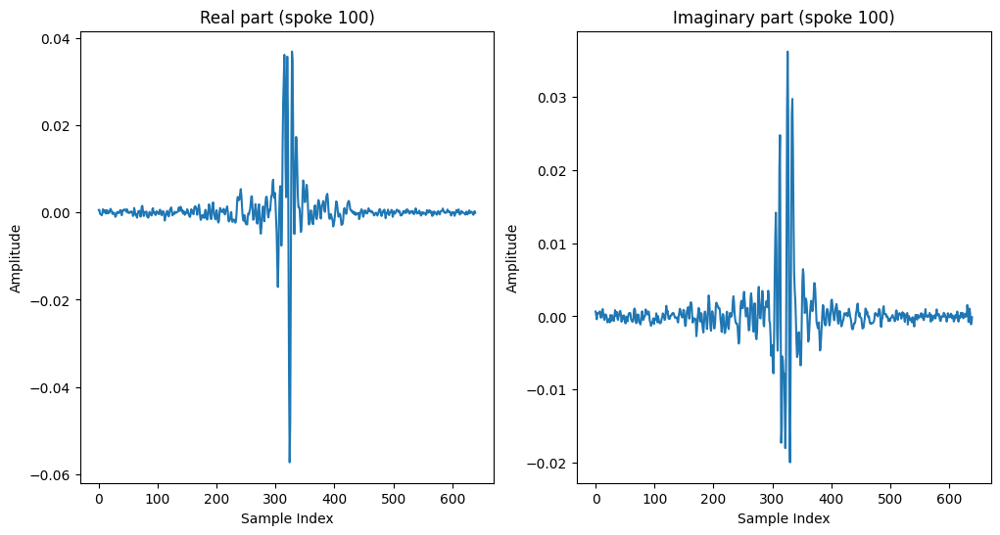

In [20]:
plot_radial_kspace(kspace, spoke_idx=100)

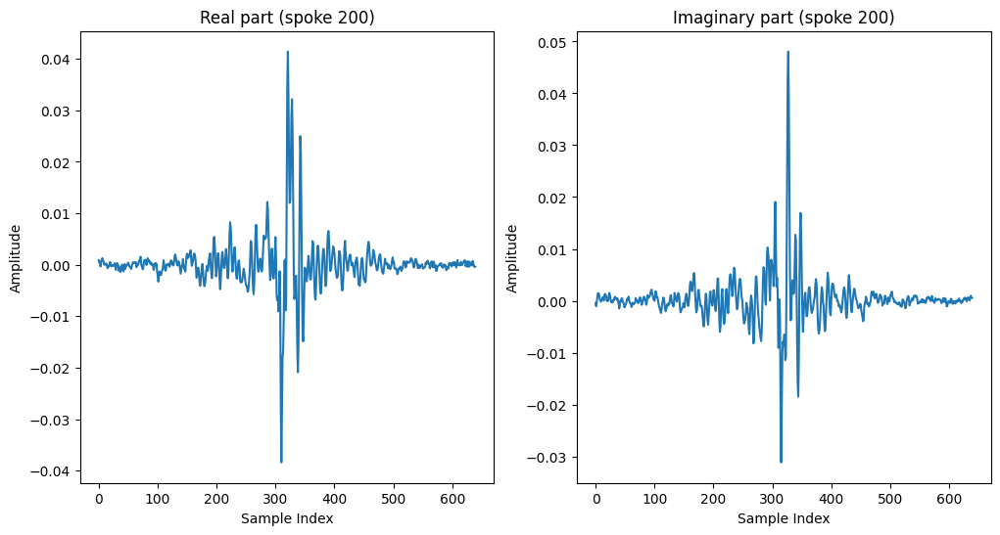

In [21]:
plot_radial_kspace(kspace, spoke_idx=200)

In [3]:
import h5py

# Path to the HDF5 file
file_path = '/gpfs/data/karczmar-lab/workspaces/rachelgordon/demo_dce_recon/fastMRI_breast_001_1/fastMRI_breast_001_1.h5'

# Open the HDF5 file
with h5py.File(file_path, 'r') as f:
    # Load the datasets
    kspace = f['kspace'][:]
    temptv = f['temptv'][:]


ksp_f = kspace.T
ksp_f = np.transpose(ksp_f, (4, 3, 2, 1, 0))
print('> kspace shape ', ksp_f.shape)
f.close()

ksp = ksp_f[0] + 1j * ksp_f[1]
ksp = np.transpose(ksp, (3, 2, 0, 1))
print(ksp.shape)

> kspace shape  (2, 288, 640, 16, 83)
(83, 16, 288, 640)


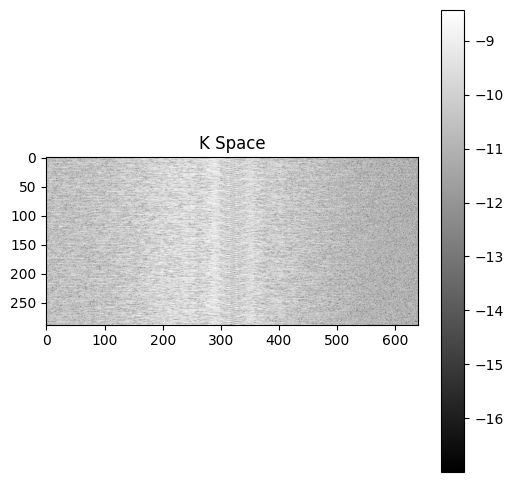

In [4]:
# Plot magnitude of the image space
plt.figure(figsize=(6, 6))
plt.imshow(np.log(np.abs(ksp[0, 0, :, :])), cmap="gray")
plt.title('K Space')
plt.colorbar()
plt.show()

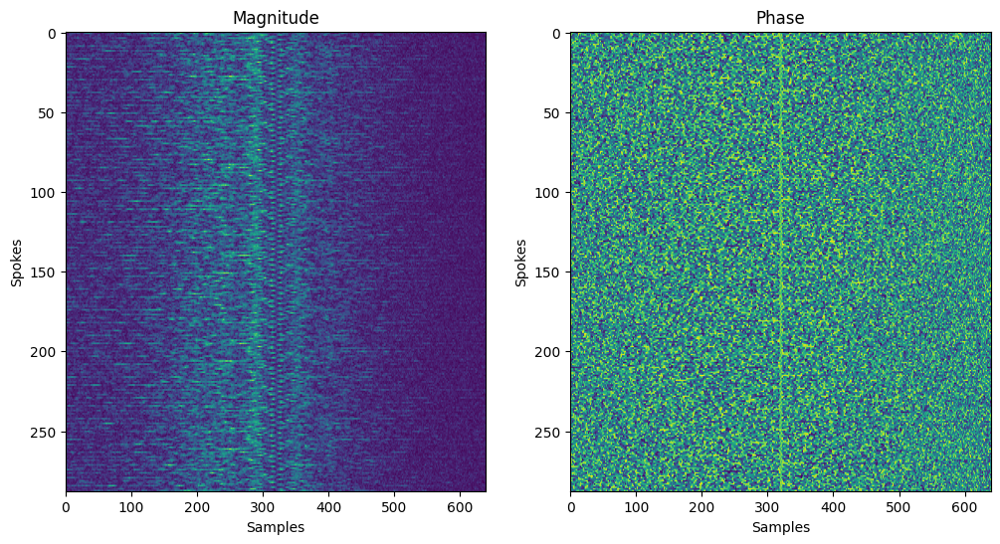

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming ksp is your complex k-space data with shape (83, 16, 288, 640)
# (partitions, coils, spokes, samples)

# Choose specific partition and coil to visualize
partition_idx = 0
coil_idx = 0

# Extract the k-space data for the selected partition and coil
kspace_selected = ksp[0, 0, :, :]

# Calculate magnitude and phase
magnitude = np.abs(kspace_selected)
phase = np.angle(kspace_selected)

# Plotting the magnitude and phase
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Magnitude plot
axes[0].imshow(magnitude)
axes[0].set_title('Magnitude')
axes[0].set_xlabel('Samples')
axes[0].set_ylabel('Spokes')
axes[0].set_aspect('auto')

# Phase plot
axes[1].imshow(phase)
axes[1].set_title('Phase')
axes[1].set_xlabel('Samples')
axes[1].set_ylabel('Spokes')
axes[1].set_aspect('auto')

plt.show()